***Deep Learning Mid Sem Project - Facial Emotion Recognition***
    by Indika Debnath





***Probem Statement***

We have trained the convolution neural network (CNN) with kaggle facial emotion dataset. so that it learns patterns for each facial expression and able to detect facial emotions

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Steps as follows:

***Step 1: Importing necessary Librabries***

We are using 

*  Keras with Tensorflow as backend
*  Numpy
*  Pandas
*  Matplotlib
*  Scikitplot 



*We have used Scikit-plot which is the python package that can help visualize  data, model(during training), and experiment results at different stages of deep learning project*

In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
tf . print(tf. __version__)

2.9.2


In [ ]:
import math
import numpy as np
import pandas as pd
import scikitplot
import seaborn as sns
from matplotlib import pyplot
import tensorflow as tf
from tensorflow.keras import optimizers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.layers import Dropout, BatchNormalization, LeakyReLU, Activation
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from keras.utils import np_utils

***Step 2: Data preprocessing***

***loading the data set***

Data preprocessing is one of the important steps in the Image processing model building.

**loading**  the pixels CSV of the file into a data frame. 

 Our data consists of 48*48 pixel grayscale images of faces.

 * The data set contains two columns, “emotion” and “pixels”

 

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/DL_Projects/fer2013.csv')
print(df.shape)
df.head()

(35887, 3)


,emotion,pixels,Usage
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training


In [ ]:
df.emotion.unique()

array([0, 2, 4, 6, 3, 5, 1])

In [ ]:
emo_label_to_text = {0:'anger', 1:'disgust', 2:'fear', 3:'happiness', 4: 'sadness', 5: 'surprise', 6: 'neutral'}

In [ ]:
df.emotion.value_counts()

3    8989
6    6198
4    6077
2    5121
0    4953
5    4002
1     547
Name: emotion, dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


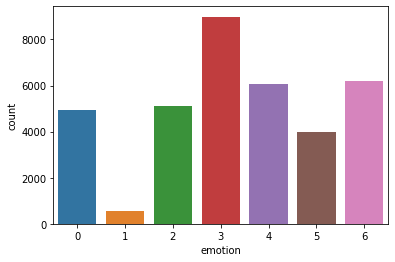

In [ ]:
sns.countplot(df.emotion)
pyplot.show()

From the SNS plot we can see  **majority classes** belongs to
  
* 3.Happy
* 4:Sad 
* 6:Neutral 

so we will **classify** these **three classes** only.

In [ ]:
math.sqrt(len(df.pixels[0].split(' ')))

48.0

We have **plotted 7 emotions** using pyplot librabry

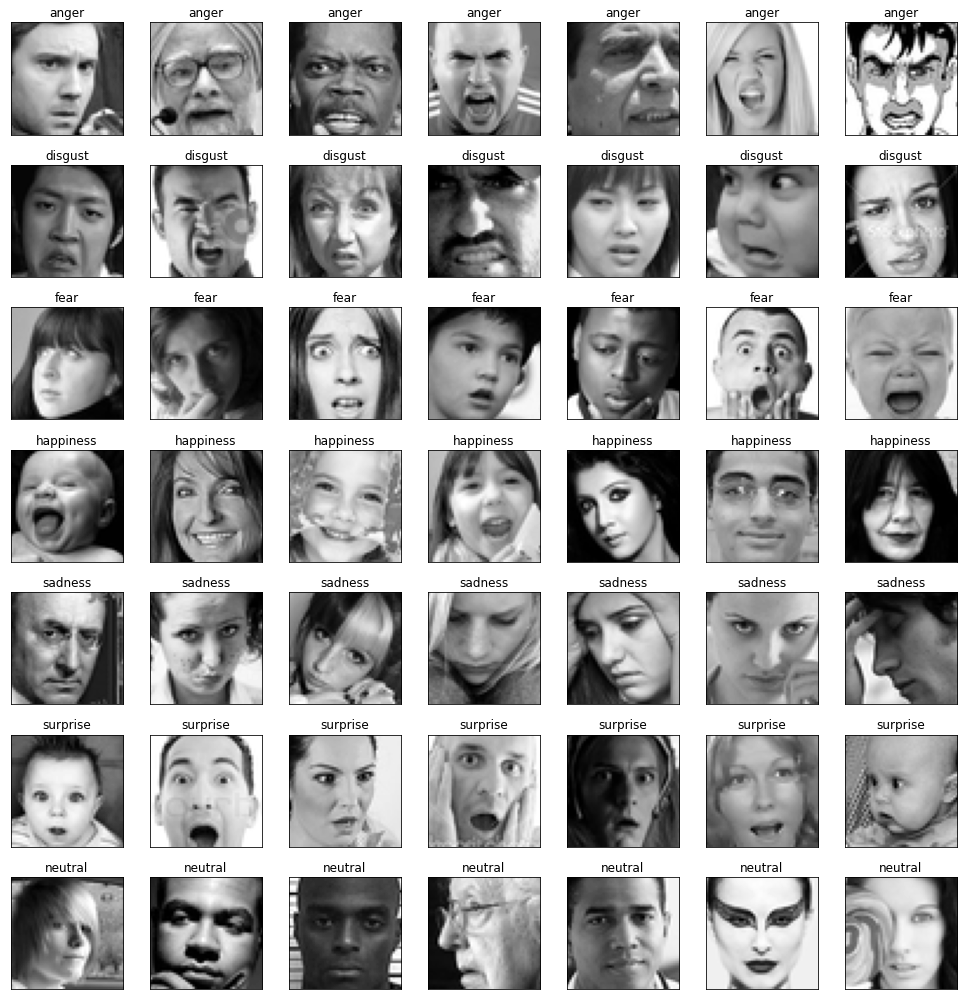

In [ ]:
fig = pyplot.figure(1, (14, 14))

k = 0
for label in sorted(df.emotion.unique()):
    for j in range(7):
        px = df[df.emotion==label].pixels.iloc[k]
        px = np.array(px.split(' ')).reshape(48, 48).astype('float32')
        px = tuple(px)
        k += 1
        ax = pyplot.subplot(7, 7, k)
        ax.imshow(px, cmap='gray')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(emo_label_to_text[label])
        pyplot.tight_layout()

the **three labels** which we are classifying

In [ ]:
OUR_LABELS = [3, 4, 6]

In [ ]:
df = df[df.emotion.isin(OUR_LABELS)]
df.shape

(21264, 3)

***Flattening the input***

We  have **flattened** our array(emotions pixel) to fed to the input neural network

In [ ]:
#converting the images into numpy array
img_array = df.pixels.apply(lambda x: np.array(x.split(' ')).reshape(48, 48, 1).astype('float32'))
img_array = np.stack(img_array, axis=0)


In [ ]:
img_array.shape

(21264, 48, 48, 1)

***Label encoding the data***

This converts each value in a categorical column into a numerical value. Each value in a categorical column is called Label.

We have used **LabelEncoder()** from Scikit learn library

In [ ]:
le = LabelEncoder()
img_labels = le.fit_transform(df.emotion)
img_labels = np_utils.to_categorical(img_labels)
img_labels.shape

(21264, 3)

In [ ]:
mapped_label_name = dict(zip(le.classes_, le.transform(le.classes_)))
print(mapped_label_name)

{3: 0, 4: 1, 6: 2}


***Splitting dataset***

We have **splitted** our dataset into the **train** and **testing** set. So that we can check whether the model is **overfitted** to the training dataset or not checking with the testing dataset.

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(img_array, img_labels,
                                                    shuffle=True, stratify=img_labels,
                                                    test_size=0.1, random_state=42)
X_train.shape, X_valid.shape, y_train.shape, y_valid.shape

((19137, 48, 48, 1), (2127, 48, 48, 1), (19137, 3), (2127, 3))

In [ ]:
#The del keyword is used to delete objects. In Python everything is an object, 
#so the del keyword can also be used to delete variables, lists, or parts of a list etc.
del df
del img_array
del img_labels

number of elements in each **dimension**

In [ ]:
img_width = X_train.shape[1]
img_height = X_train.shape[2]
img_depth = X_train.shape[3]
num_classes = y_train.shape[1]

***Normalizing the data***


* normalizing  pixel values is important  because neural networks rely on gradient calculations. These networks are trying to learn how important or how weighty a certain pixel should be in determining the class of an image.
* we are applying normalization to recieve better accuracy and convergence
* the pixel value of image range from [0,255 ]we scale this to [0,1] by dividing each pixel by its maximum value
* The numerical from of the data will be fed to machine which recieves tensor as the input


In [ ]:
# Normalizing results, as neural networks are very sensitive to unnormalized data.
X_train = X_train / 255.
X_valid = X_valid / 255.

***Step 3: Build the model using Convolutional Neural Networks(CNN):***

* We have used **Kernel Initializers** are also known as weight initializers, define the way to set the initial random weights of Keras layers.we have used **he_normal** . 

* We have used **Keras Conv2D** is a 2D Convolution Layer, this layer creates a convolution kernel that is wind with layers input which helps produce a tensor of outputs 

* **kernel_size** This parameter determines the dimensions of the kernel. 
* **Pooling** We have used max Pooling layers to reduce the dimensions of the feature maps. 
* **Batch Normalization** it normalize hidden layers, activations which speed up the learning of weights in deeper layers.
* **Activation Function** We have used ELU, also know as Exponential Linear Unit is an activation function which is somewhat similar to the ReLU with some differences. Similar to other non-saturating activation functions, ELU does not suffer from the problem of vanishing gradients and exploding gradients, ELU does not suffer from the problems of dying neurons. Outer layer we have used Softmax activation function
* **Dropout Regularization** It helps to reduce overfitting. We have used dropout rate .4 at each layer
* **Optimzer** We have used nadam optimizer to optimize the model weights (parameters during training) Nadam, is an extension of the Adam algorithm that incorporates Nesterov momentum and can result in better performance of the optimization algorithm.
* This is a Deep Convolutional Neural Network (DCNN). 
* droput layer, flatten layer, Dense layer


In [ ]:
def our_network(optim):
   
    
    net = Sequential(name='DCNN')

    net.add(
        Conv2D(
            filters=64,
            kernel_size=(5,5),
            input_shape=(img_width, img_height, img_depth),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal', 
            name='conv2d_1'
        )
    )
    net.add(BatchNormalization(name='batchnorm_1'))
    net.add(
        Conv2D(
            filters=64,
            kernel_size=(5,5),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_2'
        )
    )
    net.add(BatchNormalization(name='batchnorm_2'))
    
    net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_1'))
    net.add(Dropout(0.4, name='dropout_1'))

    net.add(
        Conv2D(
            filters=128,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_3'
        )
    )
    net.add(BatchNormalization(name='batchnorm_3'))
    net.add(
        Conv2D(
            filters=128,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_4'
        )
    )
    net.add(BatchNormalization(name='batchnorm_4'))
    
    net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_2'))
    net.add(Dropout(0.4, name='dropout_2'))

    net.add(
        Conv2D(
            filters=256,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_5'
        )
    )
    net.add(BatchNormalization(name='batchnorm_5'))
    net.add(
        Conv2D(
            filters=256,
            kernel_size=(3,3),
            activation='elu',
            padding='same',
            kernel_initializer='he_normal',
            name='conv2d_6'
        )
    )
    net.add(BatchNormalization(name='batchnorm_6'))
    
    net.add(MaxPooling2D(pool_size=(2,2), name='maxpool2d_3'))
    net.add(Dropout(0.5, name='dropout_3'))

    net.add(Flatten(name='flatten'))
        
    net.add(
        Dense(
            128,
            activation='elu',
            kernel_initializer='he_normal',
            name='dense_1'
        )
    )
    net.add(BatchNormalization(name='batchnorm_7'))
    
    net.add(Dropout(0.6, name='dropout_4'))
    
    net.add(
        Dense(
            num_classes,
            activation='softmax',
            name='out_layer'
        )
    )
    
    net.compile(
        loss='categorical_crossentropy',
        optimizer=optim,
        metrics=['accuracy']
    )
    
    net.summary()
    
    return net

***Applying Early Stopping for optimal learning***

* a model should run on optimal number of epoch to to avoid overfitting so that it can monitor loss and accuracy on the validation data set while training and stop the training procedure when model overfits
* we used two **callbacks** one is **`early stopping**` for avoiding overfitting training data
* another we have used **ReduceLROnPlateau()** to reduce learning rate when metric has stopped improving

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0.00005,
    patience=11,
    verbose=1,
    restore_best_weights=True,
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_accuracy',
    factor=0.5,
    patience=7,
    min_lr=1e-7,
    verbose=1,
)

callbacks = [
    early_stopping,
    lr_scheduler,
]

***Applying Data Augmentation***

* Important process in image processing it is the process of increasing the size of training data set  using the image already exist in training set but with small random modifications like **rotation**, **flipping**, **zooming** etc
* reduces overfit and more chance to generalization
* we have used **ImagedataGenerator** of keras API for augemntation

In [ ]:
augmented_data = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
)
augmented_data.fit(X_train)

***Step 4: Training our model:***

* We have trained the model with **batch size 32**

In [ ]:
batch_size = 32 
epochs = 100
optims = [
    optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name='Nadam'),
    optimizers.Adam(0.001),
]

# We used both `Nadam` and `Adam`, the difference in results is not different but we finally went with Nadam as it is more popular.
model = our_network(optims[1]) 
history = model.fit_generator(
    augmented_data.flow(X_train, y_train, batch_size=batch_size),
    validation_data=(X_valid, y_valid),
    steps_per_epoch=len(X_train) / batch_size,
    epochs=epochs,
    callbacks=callbacks,
    use_multiprocessing=True
)

Model: "DCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 48, 48, 64)        1664      
                                                                 
 batchnorm_1 (BatchNormaliza  (None, 48, 48, 64)       256       
 tion)                                                           
                                                                 
 conv2d_2 (Conv2D)           (None, 48, 48, 64)        102464    
                                                                 
 batchnorm_2 (BatchNormaliza  (None, 48, 48, 64)       256       
 tion)                                                           
                                                                 
 maxpool2d_1 (MaxPooling2D)  (None, 24, 24, 64)        0         
                                                                 
 dropout_1 (Dropout)         (None, 24, 24, 64)        0      

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  app.launch_new_instance()


Epoch 1/100
598/598 [==============================] - 24s 25ms/step - loss: 1.3281 - accuracy: 0.4014 - val_loss: 1.0130 - val_accuracy: 0.4593 - lr: 0.0010
Epoch 2/100
598/598 [==============================] - 14s 24ms/step - loss: 1.0334 - accuracy: 0.4755 - val_loss: 0.9418 - val_accuracy: 0.5463 - lr: 0.0010
Epoch 3/100
598/598 [==============================] - 16s 26ms/step - loss: 0.9348 - accuracy: 0.5429 - val_loss: 0.7862 - val_accuracy: 0.6356 - lr: 0.0010
Epoch 4/100
598/598 [==============================] - 15s 24ms/step - loss: 0.8581 - accuracy: 0.5931 - val_loss: 0.7491 - val_accuracy: 0.6465 - lr: 0.0010
Epoch 5/100
598/598 [==============================] - 15s 24ms/step - loss: 0.7850 - accuracy: 0.6343 - val_loss: 0.6578 - val_accuracy: 0.7127 - lr: 0.0010
Epoch 6/100
598/598 [==============================] - 17s 29ms/step - loss: 0.7388 - accuracy: 0.6642 - val_loss: 0.6768 - val_accuracy: 0.7038 - lr: 0.0010
Epoch 7/100
598/598 [==============================]

***Saving the Model & Architecture***

* model.h5 --> We have saved weights of the model which is trained with 100 epochs
* model.json --> We have saved architecture of the neural network.

In [ ]:
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
    
model.save("model.h5")

***Accuracy & Loss Function progression Graph***

* below figure represents accuracy and loss function progression during training phase for both train and test data
* we have plotted **accuracy vs number of epochs** 
* The epochs history shows that accuracy gradually increases and achieved **+80% accuracy** on both training and validation set, but at the end the model starts overfitting training data

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

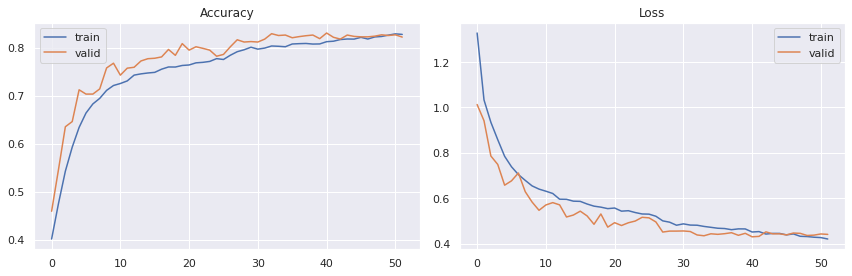

In [ ]:
sns.set()
fig = pyplot.figure(0, (12, 4))

ax = pyplot.subplot(1, 2, 1)
sns.lineplot(history.epoch, history.history['accuracy'], label='train')
sns.lineplot(history.epoch, history.history['val_accuracy'], label='valid')
pyplot.title('Accuracy')
pyplot.tight_layout()

ax = pyplot.subplot(1, 2, 2)
sns.lineplot(history.epoch, history.history['loss'], label='train')
sns.lineplot(history.epoch, history.history['val_loss'], label='valid')
pyplot.title('Loss')
pyplot.tight_layout()

pyplot.savefig('epoch_history_dcnn.png')
pyplot.show()

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix


In [ ]:
from sklearn.metrics import plot_confusion_matrix


***Prediction Output (Classification Matrix)***

The confusion matrix clearly shows that our model is doing good job on the class happy but it's performance is low on other two classes. One of the reason for this could be the fact that these two classes have less data. But when We looked at the images we found some images from these two classes are even hard for a human to tell whether the person is sad or neutral. Facial expression depends on individual as well. Some person's neutral face looks like sad.

67/67 [==============================] - 1s 8ms/step
total wrong validation predictions: 359


              precision    recall  f1-score   support

           0       0.93      0.93      0.93       899
           1       0.80      0.72      0.76       608
           2       0.72      0.79      0.76       620

    accuracy                           0.83      2127
   macro avg       0.82      0.82      0.82      2127
weighted avg       0.83      0.83      0.83      2127



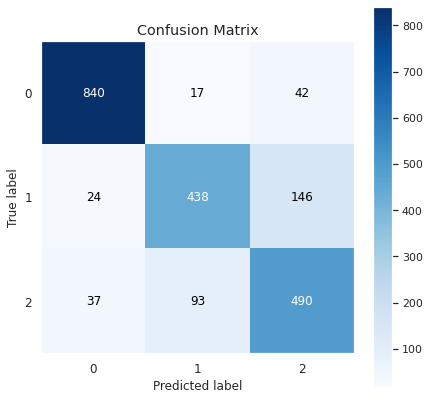

In [ ]:
yhat_valid = model.predict(X_valid).argmax(axis=1)
scikitplot.metrics.plot_confusion_matrix(np.argmax(y_valid, axis=1), yhat_valid, figsize=(7,7))
pyplot.savefig("confusion_matrix_dcnn.png")

print(f'total wrong validation predictions: {np.sum(np.argmax(y_valid, axis=1) != yhat_valid)}\n\n')
print(classification_report(np.argmax(y_valid, axis=1), yhat_valid))

In [ ]:
emotion_dict = {0: "happy",1: "sad",2: "neutral",}
emojis = {0:"\U0001f60A",1:"\U0001f625" ,2:"\U0001f610" ,}

***Step5: Checking our model with Validation data***

We have taken the real time image data to check the prediction capacity of our model.

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

def _predict(path):
  facecasc = cv2.CascadeClassifier('/content/drive/MyDrive/DL_Projects/haarcascade_frontalface_default.xml')
  imagePath = '/content/'+path
  image = cv2.imread(imagePath)
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  faces = facecasc.detectMultiScale(gray,scaleFactor=1.3, minNeighbors=10)
  print("No of faces : ",len(faces))
  i = 1
  for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
    roi_gray = gray[y:y + h, x:x + w]
    cropped_img = np.expand_dims(np.expand_dims(cv2.resize(roi_gray, (48, 48)), -1), 0)
    prediction = model.predict(cropped_img)

    maxindex = int(np.argmax(prediction))
    print("person ",i," : ",emotion_dict[maxindex], "-->",emojis[maxindex])
    cv2.putText(image, emotion_dict[maxindex], (x+10, y-20), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
  
  cv2_imshow(image)

No of faces :  1
1/1 [==============================] - 0s 17ms/step
person  1  :  sad --> 😥


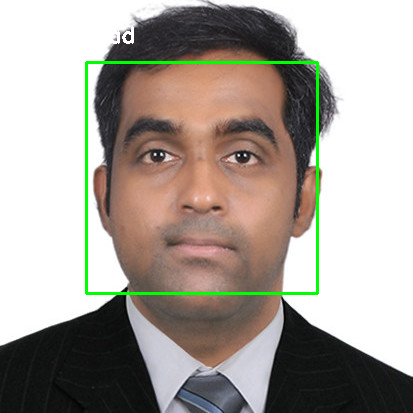

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Dr_Rev.jpg")

No of faces :  1
1/1 [==============================] - 0s 17ms/step
person  1  :  happy --> 😊


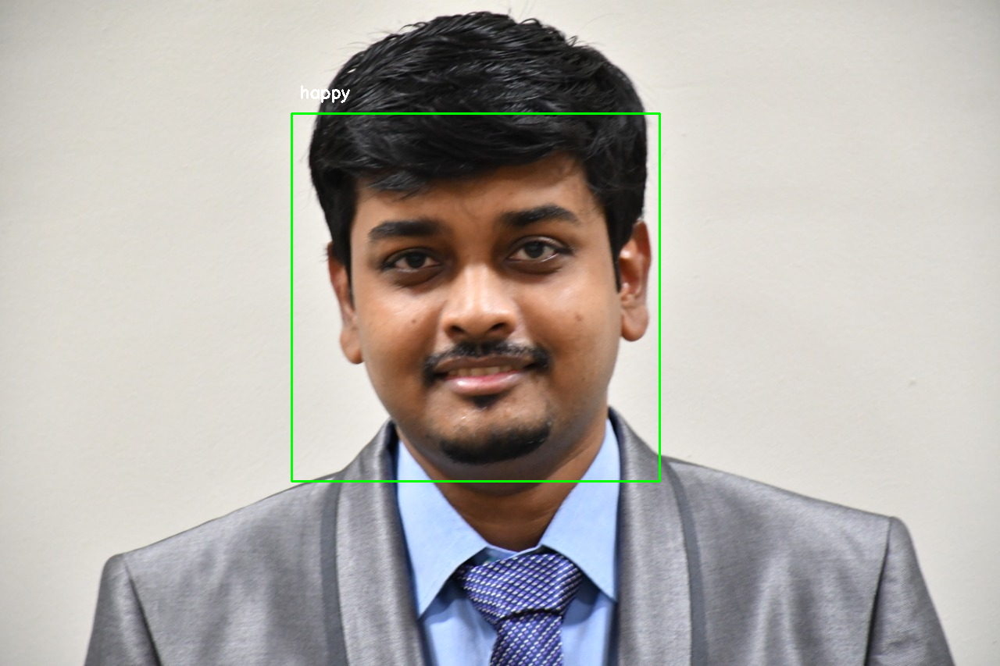

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Sayantan.jpeg")

No of faces :  1
1/1 [==============================] - 0s 24ms/step
person  1  :  neutral --> 😐


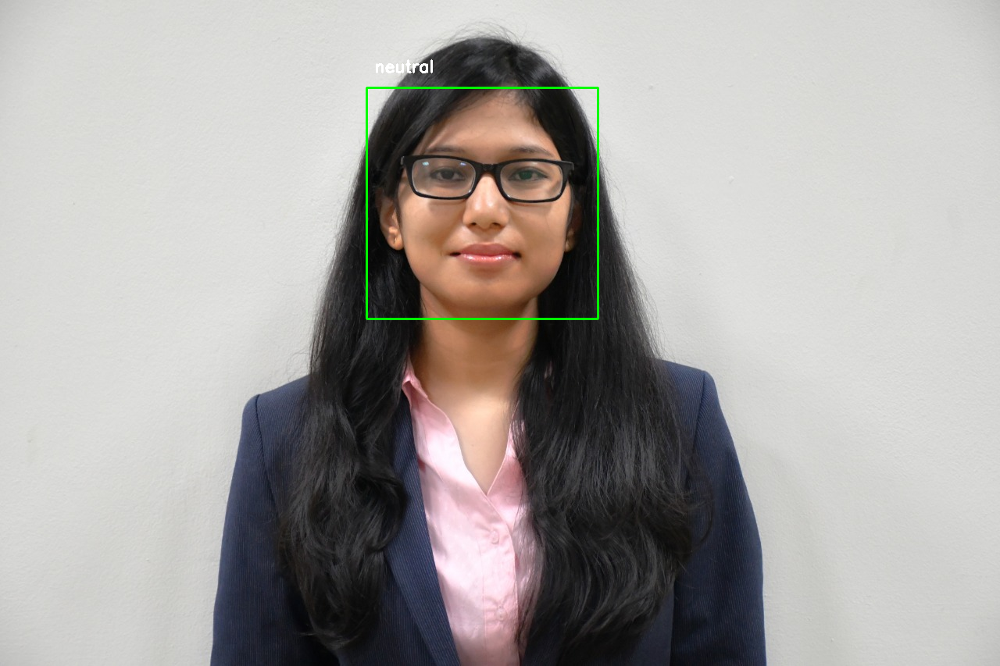

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Indika.jpeg")

No of faces :  1
1/1 [==============================] - 0s 18ms/step
person  1  :  sad --> 😥


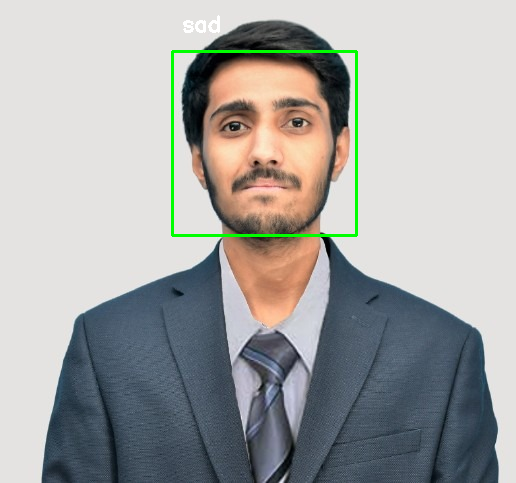

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Francis.jpeg")

No of faces :  1
1/1 [==============================] - 0s 30ms/step
person  1  :  neutral --> 😐


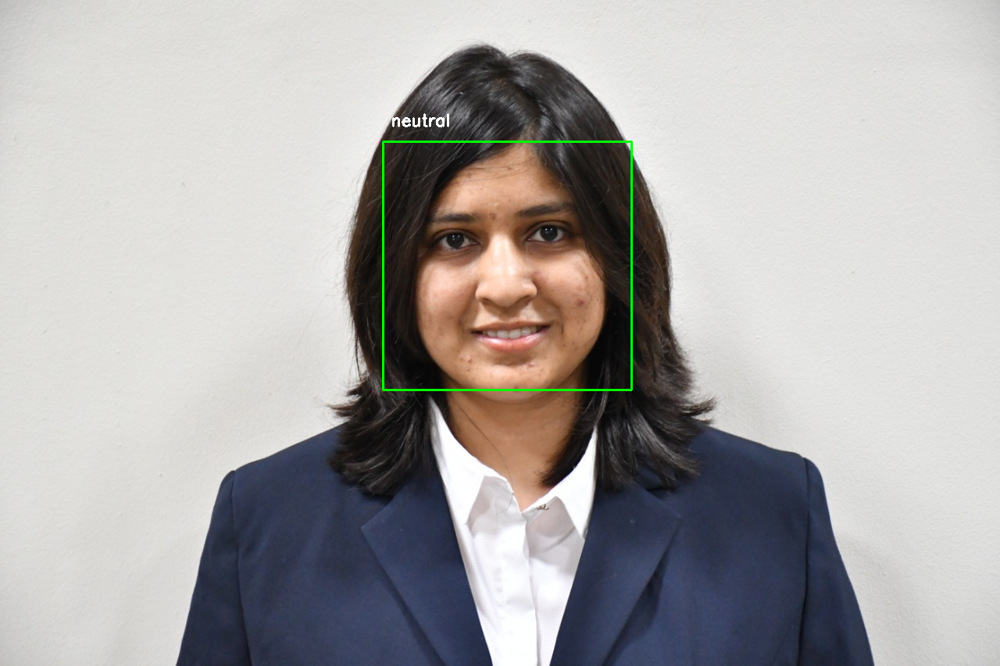

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Arushi.jpeg")

No of faces :  1
1/1 [==============================] - 0s 17ms/step
person  1  :  sad --> 😥


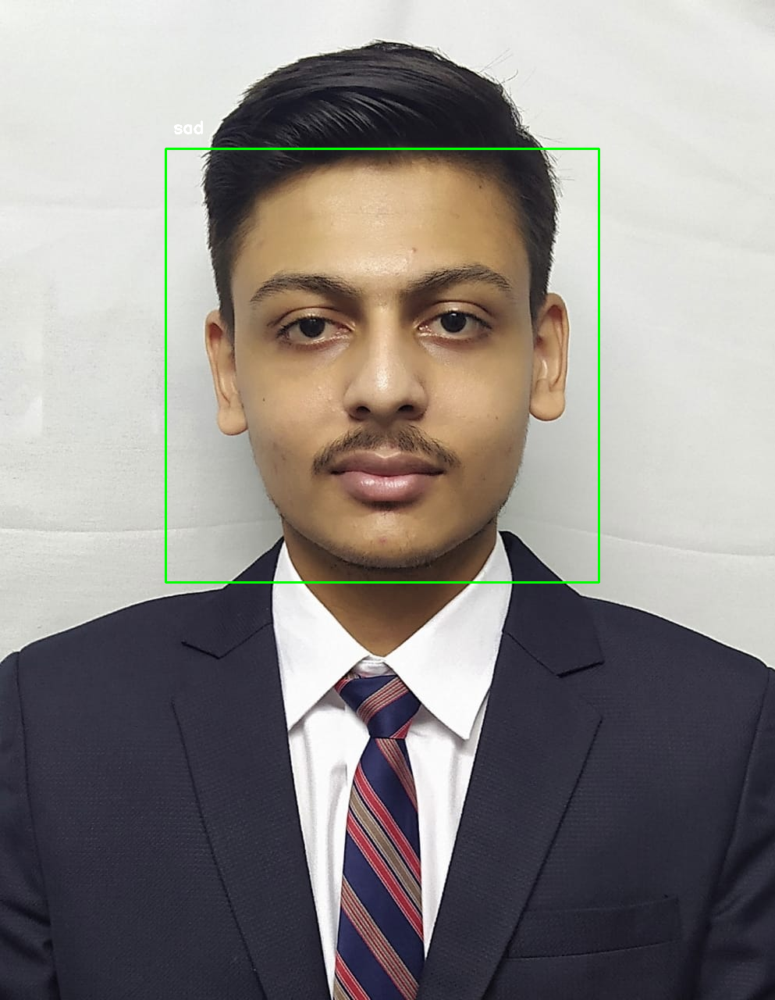

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Maanvendra.jpeg")

No of faces :  1
1/1 [==============================] - 0s 20ms/step
person  1  :  happy --> 😊


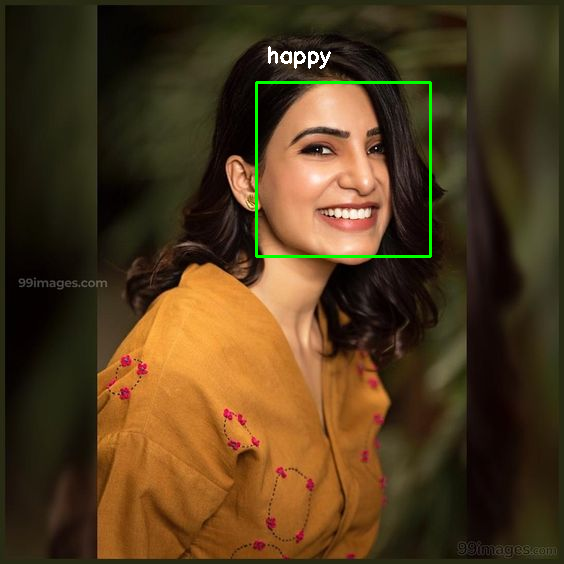

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Samantha.jpg")

No of faces :  1
1/1 [==============================] - 0s 21ms/step
person  1  :  happy --> 😊


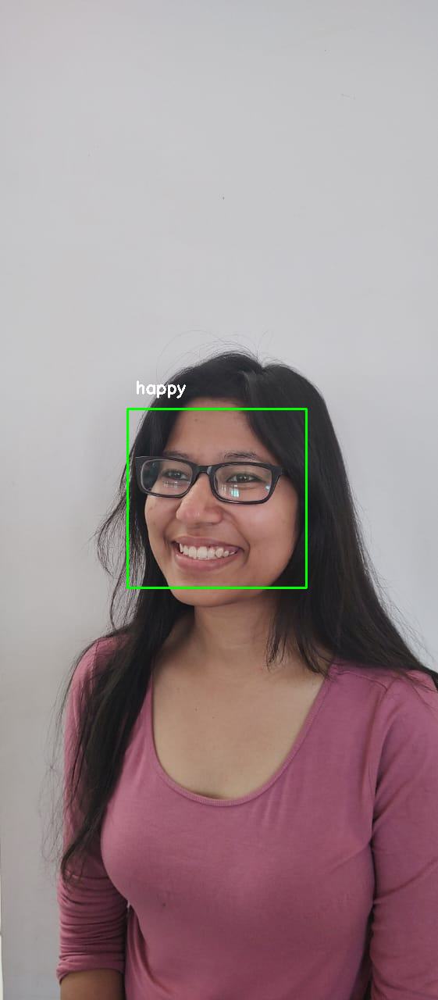

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Indika_2.jpeg")

No of faces :  1
1/1 [==============================] - 0s 33ms/step
person  1  :  neutral --> 😐


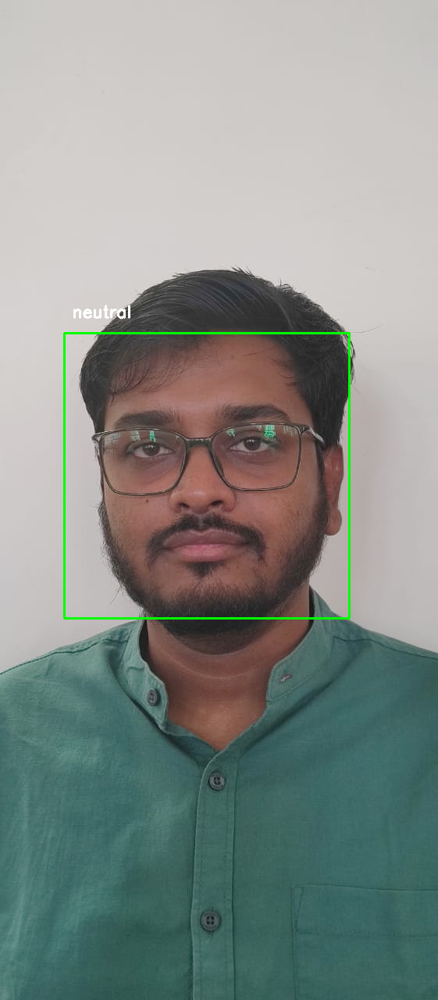

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Sayantan_2.jpeg")

No of faces :  1
1/1 [==============================] - 0s 23ms/step
person  1  :  sad --> 😥


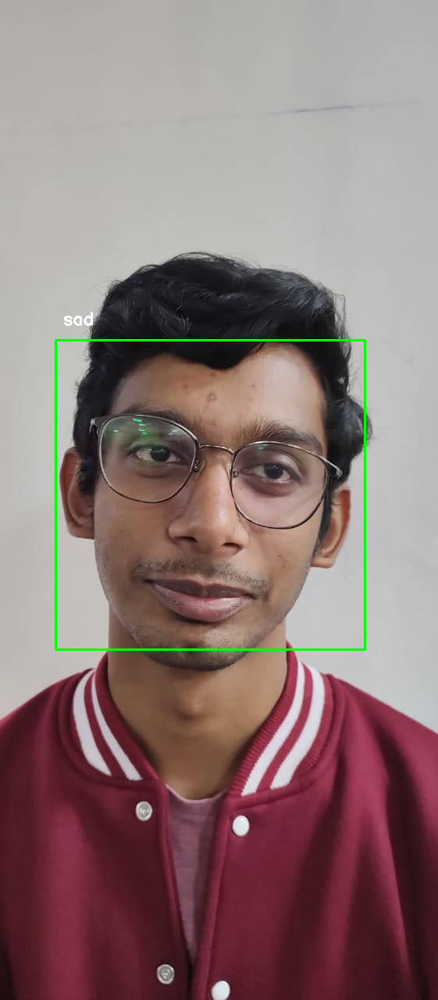

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Karan.jpeg")

No of faces :  5
1/1 [==============================] - 0s 43ms/step
person  1  :  happy --> 😊
1/1 [==============================] - 0s 27ms/step
person  1  :  sad --> 😥
1/1 [==============================] - 0s 28ms/step
person  1  :  sad --> 😥
1/1 [==============================] - 0s 45ms/step
person  1  :  sad --> 😥
1/1 [==============================] - 0s 28ms/step
person  1  :  sad --> 😥


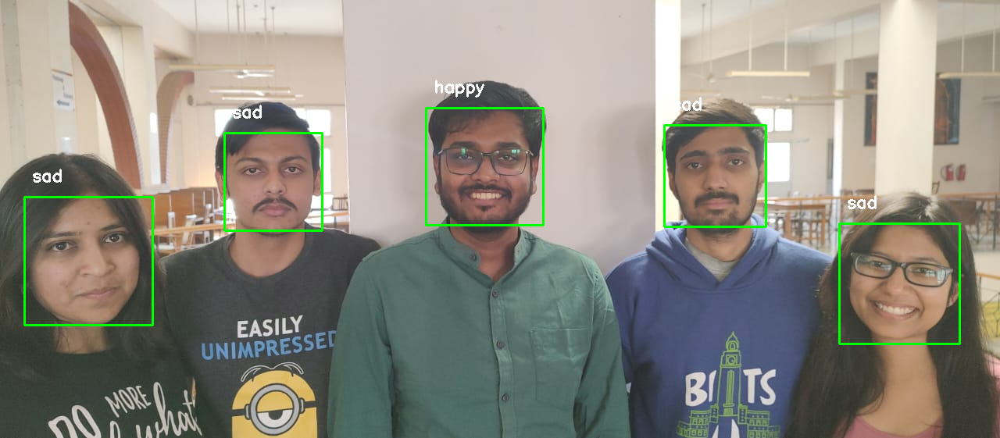

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Group_1.jpeg")

No of faces :  4
1/1 [==============================] - 0s 23ms/step
person  1  :  happy --> 😊
1/1 [==============================] - 0s 22ms/step
person  1  :  happy --> 😊
1/1 [==============================] - 0s 21ms/step
person  1  :  happy --> 😊
1/1 [==============================] - 0s 31ms/step
person  1  :  happy --> 😊


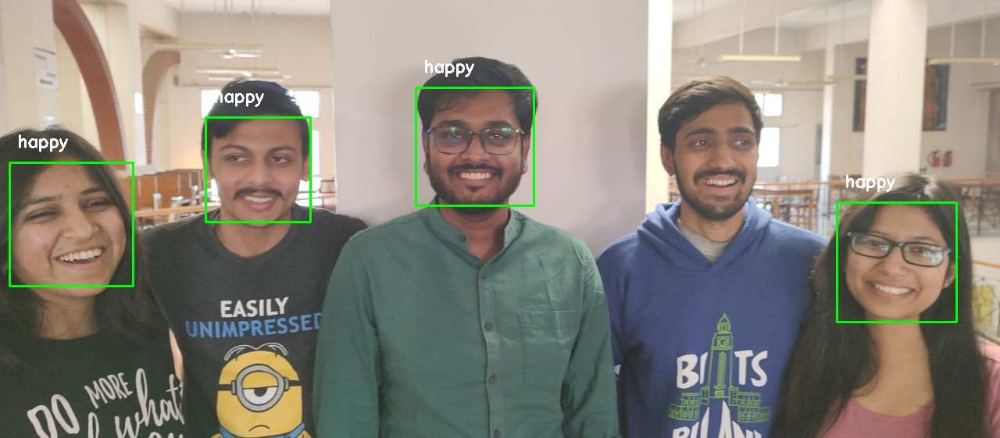

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Group_2.jpeg")

No of faces :  5
1/1 [==============================] - 0s 24ms/step
person  1  :  happy --> 😊
1/1 [==============================] - 0s 30ms/step
person  1  :  sad --> 😥
1/1 [==============================] - 0s 27ms/step
person  1  :  sad --> 😥
1/1 [==============================] - 0s 23ms/step
person  1  :  sad --> 😥
1/1 [==============================] - 0s 24ms/step
person  1  :  happy --> 😊


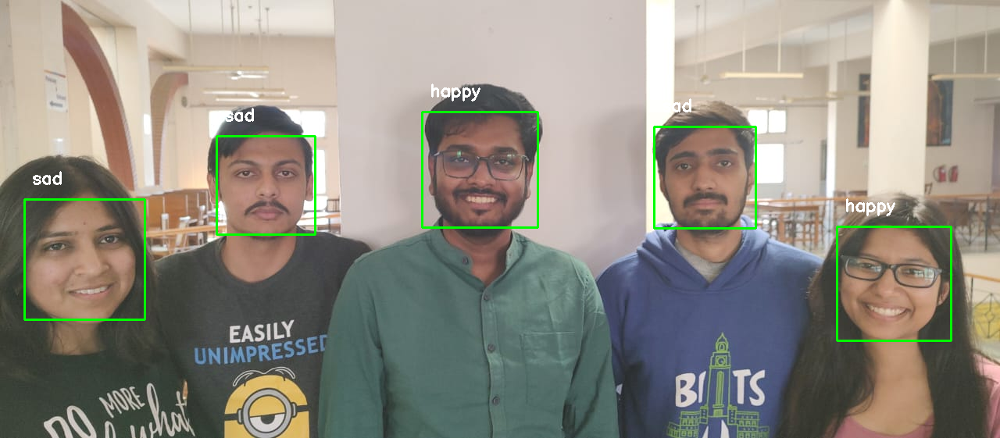

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Group_3.jpeg")

No of faces :  1
1/1 [==============================] - 0s 18ms/step
person  1  :  happy --> 😊


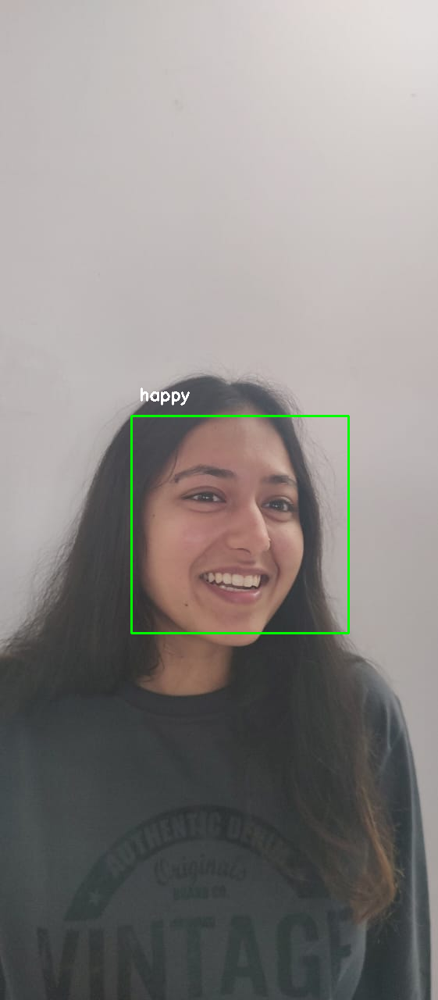

In [ ]:
_predict("/drive/MyDrive/DL_Projects/images/Akshara.jpeg")